## Generating training data (provided script)

##### https://github.com/KevinMenden/scaden

In [1]:
import pandas as pd
import numpy as np
import scanpy.api as sc
import scanpy as scanpy
import scipy.sparse
import anndata as ad
import random 

import pandas as pd
from sklearn import preprocessing


sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=150, color_map='viridis')
sc.logging.print_versions()
#WRKDIR = "/Users/mooreank/Desktop/Raph/Deconvolution"
num_top_genes = 90

WRKDIR = '/labshare/anni/deconvolution/scaden'
nabec_dir = '/labshare/LNG_Single_cell_data/CS025040_Cookson_Langston/02_PrimaryAnalysisOutput/00_FullCellrangerOutputs/'
rosmap_dir = '/labshare/anni/rosmap_sn/'


/home/mooreank/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/mooreank/anaconda3/lib/python3.7/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning,


scanpy==1.4.6 anndata==0.7.1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.23.1 statsmodels==0.11.0 python-igraph==0.8.2 louvain==0.6.1


In [16]:
##load function
def load_and_subset(file_dir, filename):  
    path = file_dir+filename+'/outs/filtered_feature_bc_matrix/'
    adata = scanpy.read_10x_mtx(path)
    print(adata)
    cell = adata.obs.index.tolist()
    subset_cell = random.sample(cell, 5000)
    adata = adata[subset_cell]
    print(adata)
    return adata

In [3]:
# path = "/Users/mooreank/Desktop/Raph/Deconvolution/gene.ppmi.v121018.vst.quants.hdf5"
# adata = sc.read_text(path).T
# adata

AnnData object with n_obs × n_vars = 0 × 613 

In [ ]:
# path = "/Users/mooreank/Desktop/Raph/Deconvolution/human_MTG_2018-06-14_exon-matrix.csv"
# adata = pd.read_csv(path)

In [ ]:
##nabec data:
##labshare/LNG_Single_cell_data/Single_nuclei_human_brain/Frontal_cortex/data/

##rosmap data:
##/labshare/anni/rosmap_sn

In [11]:
#path = f"{WRKDIR}/nabec/filtered_feature_bc_matrix_SCAF705_190320_A72/"

# ##NABEC
# # nabec_dir = '/labshare/LNG_Single_cell_data/CS025040_Cookson_Langston/02_PrimaryAnalysisOutput/00_FullCellrangerOutputs'
# path = f'{nabec_dir}/SCAF772_1027/outs/filtered_feature_bc_matrix/'
# adata_nabec1 = scanpy.read_10x_mtx(path)

# path = f'{nabec_dir}/SCAF773_1672/outs/filtered_feature_bc_matrix/'
# adata_nabec2 = scanpy.read_10x_mtx(path)

# path = f'{nabec_dir}/SCAF774_1363/outs/filtered_feature_bc_matrix/'
# adata_nabec3 = scanpy.read_10x_mtx(path)

# path = f'{nabec_dir}/SCAF775_5123/outs/filtered_feature_bc_matrix/'
# adata_nabec4 = scanpy.read_10x_mtx(path)

# path = f'{nabec_dir}/SCAF793_630/outs/filtered_feature_bc_matrix/'
# adata_nabec5 = scanpy.read_10x_mtx(path)

# path = f'{nabec_dir}/SCAF794_1584/outs/filtered_feature_bc_matrix/'
# adata_nabec6 = scanpy.read_10x_mtx(path)

# adata_nabec = adata_nabec1.concatenate([adata_nabec2,adata_nabec3,adata_nabec4])




In [19]:
#path = f"{WRKDIR}/nabec/filtered_feature_bc_matrix_SCAF705_190320_A72/"

##NABEC
adata_nabec1 = load_and_subset(nabec_dir, 'SCAF772_1027')
adata_nabec2 = load_and_subset(nabec_dir, 'SCAF773_1672')
adata_nabec3 = load_and_subset(nabec_dir, 'SCAF774_1363')
adata_nabec4 = load_and_subset(nabec_dir, 'SCAF775_5123')
adata_nabec5 = load_and_subset(nabec_dir, 'SCAF793_630')
adata_nabec6 = load_and_subset(nabec_dir, 'SCAF794_1584')
adata_nabec7 = load_and_subset(nabec_dir, 'SCAF795_4022')
adata_nabec8 = load_and_subset(nabec_dir, 'SCAF796_5079')
adata_nabec9 = load_and_subset(nabec_dir, 'SCAF853_4924')
adata_nabec10 = load_and_subset(nabec_dir,'SCAF854_1135')

adata_nabec = adata_nabec1.concatenate([adata_nabec2,adata_nabec3,adata_nabec4,adata_nabec5,
                                        adata_nabec6,adata_nabec7,adata_nabec8,adata_nabec9,adata_nabec10])

adata_nabec


--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 10533 × 33538 
    var: 'gene_ids', 'feature_types'
View of AnnData object with n_obs × n_vars = 5000 × 33538 
    var: 'gene_ids', 'feature_types'
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 9110 × 33538 
    var: 'gene_ids', 'feature_types'
View of AnnData object with n_obs × n_vars = 5000 × 33538 
    var: 'gene_ids', 'feature_types'
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 9971 × 33538 
    var: 'gene_ids', 'feature_types'
View of AnnData object with n_obs × n_vars = 5000 × 33538 
    var: 'gene_ids', 'feature_types'
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache f

AnnData object with n_obs × n_vars = 50000 × 33538 
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [18]:

##ROSMAP
adata_rosmap1 = load_and_subset(rosmap_dir, 'MFC-B1-S1-Cdx1-pAD0-counts')
adata_rosmap2 = load_and_subset(rosmap_dir, 'MFC-B1-S2-Cdx1-pAD0-counts')
adata_rosmap3 = load_and_subset(rosmap_dir, 'MFC-B1-S3-Cdx1-pAD1-counts')
adata_rosmap4 = load_and_subset(rosmap_dir, 'MFC-B1-S4-Cdx1-pAD1-counts')
adata_rosmap5 = load_and_subset(rosmap_dir, 'MFC-B2-11-Cog1-Path1-counts')
adata_rosmap6 = load_and_subset(rosmap_dir, 'MFC-B1-S6-Cdx4-pAD0-counts')
adata_rosmap7 = load_and_subset(rosmap_dir, 'MFC-B1-S7-Cdx4-pAD1-counts')
adata_rosmap8 = load_and_subset(rosmap_dir, 'MFC-B1-S8-Cdx4-pAD1-counts')
adata_rosmap9 = load_and_subset(rosmap_dir, 'MFC-B1-S8-Cdx4-pAD1-counts')
adata_rosmap10 = load_and_subset(rosmap_dir, 'MFC-B2-10-Cog1-Path0-counts')

adata_rosmap = adata_rosmap1.concatenate([adata_rosmap2,adata_rosmap3,adata_rosmap4,adata_rosmap5,
                                         adata_rosmap6,adata_rosmap7,adata_rosmap8,adata_rosmap9,adata_rosmap10])



--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 8659 × 33538 
    var: 'gene_ids', 'feature_types'
View of AnnData object with n_obs × n_vars = 5000 × 33538 
    var: 'gene_ids', 'feature_types'
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 7038 × 33538 
    var: 'gene_ids', 'feature_types'
View of AnnData object with n_obs × n_vars = 5000 × 33538 
    var: 'gene_ids', 'feature_types'
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
AnnData object with n_obs × n_vars = 6316 × 33538 
    var: 'gene_ids', 'feature_types'
View of AnnData object with n_obs × n_vars = 5000 × 33538 
    var: 'gene_ids', 'feature_types'
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache fi

In [12]:
adata_nabec

AnnData object with n_obs × n_vars = 37444 × 33538 
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [10]:
adata_rosmap

AnnData object with n_obs × n_vars = 37229 × 33538 
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [20]:
adata = adata_nabec.concatenate(adata_rosmap)
adata

AnnData object with n_obs × n_vars = 100000 × 33538 
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [21]:
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=5)
adata.obs['n_counts'] = adata.X.sum(axis=1)

filtered out 17640 cells that have less than 500 genes expressed
filtered out 4704 genes that are detected in less than 5 cells


... storing 'feature_types' as categorical


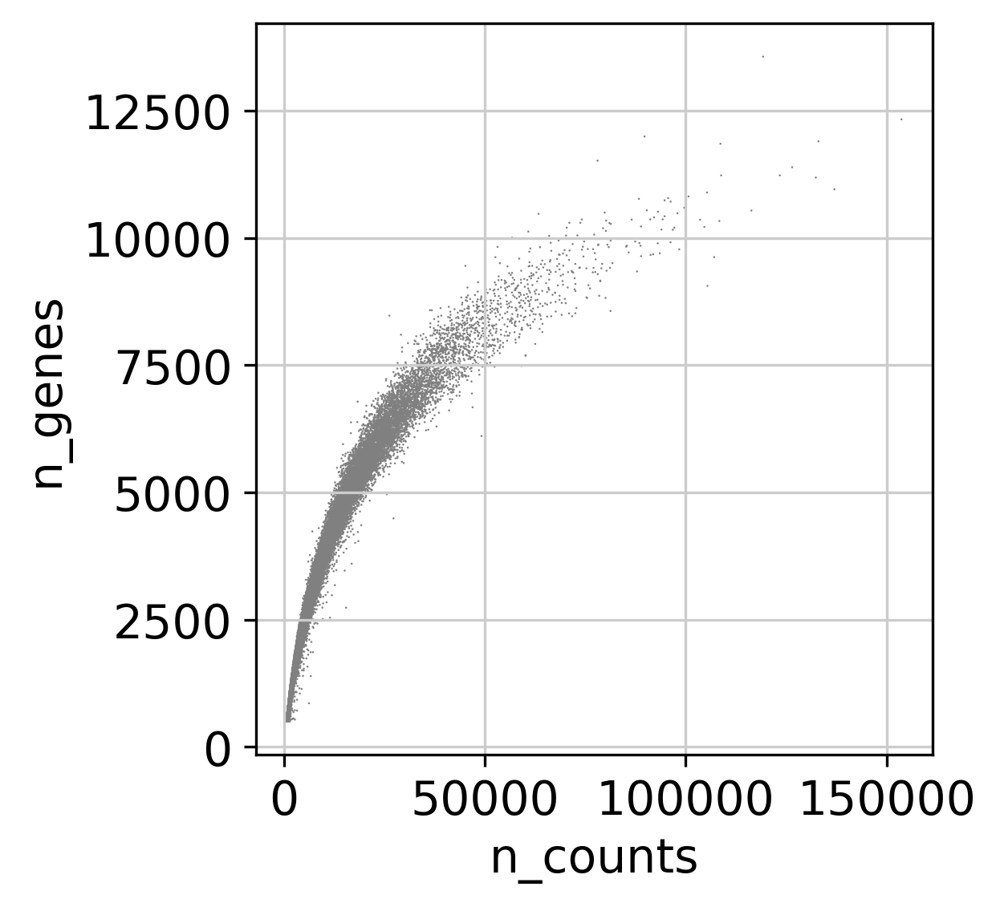

In [22]:
sc.pl.scatter(adata, x="n_counts", y='n_genes')

In [23]:
adata = adata[adata.obs['n_genes'] < 10000, :]
adata = adata[adata.obs['n_counts'] < 10000000, :]
adata_raw = adata

In [24]:
##raw single cell without cell type labeling 
df_raw = pd.DataFrame(adata.X.toarray())
df_raw.columns = list(adata.var.index)
df_raw.index = list(adata.obs.index)
df_raw = df_raw.T
print(df_raw.shape)
df_raw.head()

(28834, 82309)


,AAACGCTAGGCACTAG-1-0-0,GTCATTTAGGAGTCTG-1-0-0,GCATCTCTCTGGTCAA-1-0-0,TCACGCTGTGTGTTTG-1-0-0,CTCCCAATCGCTAATG-1-0-0,TTCCGTGTCGCTCCTA-1-0-0,CATTTCACAGCCCACA-1-0-0,CTACCTGTCCCTTGTG-1-0-0,GTAGTACGTACCAATC-1-0-0,CGGACACTCGCCGAGT-1-0-0,...,AGGTCATAGTTCGATC-1-9-1,GCAATCACATCCGCGA-1-9-1,TCATTACGTAATAGCA-1-9-1,AGAGTGGCACAGGTTT-1-9-1,AGGTCATGTATTAGCC-1-9-1,ATTCTACAGGAATGGA-1-9-1,GTCGTAATCGCATGAT-1-9-1,CAAGATCCAAGTAGTA-1-9-1,CGTTAGAGTCGGATCC-1-9-1,CTTAGGACAAGGCTCC-1-9-1
MIR1302-2HG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC114498.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL669831.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL669831.5,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
adata.raw = sc.pp.log1p(adata, copy=True)
adata

AnnData object with n_obs × n_vars = 82309 × 28834 
    obs: 'batch', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [26]:
# Normalize
sc.pp.normalize_per_cell(adata)
adata_norm = adata

normalizing by total count per cell
    finished (0:00:03): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [27]:
##norm single cell without cell type labeling 
df_norm = pd.DataFrame(adata.X.toarray())
df_norm.columns = list(adata.var.index)
df_norm.index = list(adata.obs.index)
df_norm = df_norm.T
print(df_norm.shape)
df_norm.head()

(28834, 82309)


,AAACGCTAGGCACTAG-1-0-0,GTCATTTAGGAGTCTG-1-0-0,GCATCTCTCTGGTCAA-1-0-0,TCACGCTGTGTGTTTG-1-0-0,CTCCCAATCGCTAATG-1-0-0,TTCCGTGTCGCTCCTA-1-0-0,CATTTCACAGCCCACA-1-0-0,CTACCTGTCCCTTGTG-1-0-0,GTAGTACGTACCAATC-1-0-0,CGGACACTCGCCGAGT-1-0-0,...,AGGTCATAGTTCGATC-1-9-1,GCAATCACATCCGCGA-1-9-1,TCATTACGTAATAGCA-1-9-1,AGAGTGGCACAGGTTT-1-9-1,AGGTCATGTATTAGCC-1-9-1,ATTCTACAGGAATGGA-1-9-1,GTCGTAATCGCATGAT-1-9-1,CAAGATCCAAGTAGTA-1-9-1,CGTTAGAGTCGGATCC-1-9-1,CTTAGGACAAGGCTCC-1-9-1
MIR1302-2HG,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.1,0.0,0.038411,0.0,0.0,0.0,0.0,0.219238,0.041161,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC114498.1,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL669831.2,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL669831.5,0.0,0.076822,0.0,0.0,0.0,0.0,0.000000,0.082323,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
adata.obs.index

Index(['AAACCCAAGACAACAT-1-0', 'AAACCCAAGATGAATC-1-0', 'AAACCCAAGCTGGCCT-1-0',
       'AAACCCAAGGTCCCGT-1-0', 'AAACCCAAGGTTGAGC-1-0', 'AAACCCACAAATACGA-1-0',
       'AAACCCACACCGGAAA-1-0', 'AAACCCACATTGACCA-1-0', 'AAACCCAGTATCGCAT-1-0',
       'AAACCCAGTCCAAAGG-1-0',
       ...
       'TTTGGTTTCTACCTGC-1-1', 'TTTGTCAAGTCACGCC-1-1', 'TTTGTCAAGTGTACGG-1-1',
       'TTTGTCAAGTTTGCGT-1-1', 'TTTGTCACACCGAATT-1-1', 'TTTGTCACATCGGTTA-1-1',
       'TTTGTCAGTATAGGTA-1-1', 'TTTGTCAGTCAGCTAT-1-1', 'TTTGTCATCCACGTTC-1-1',
       'TTTGTCATCTCGGACG-1-1'],
      dtype='object', length=20787)

In [28]:
# Save the complete matrix
df = pd.DataFrame(adata.X.toarray())
df.shape
df.columns = list(adata.var.index)
#df.index = list(adata.obs.index)
df.head()

,MIR1302-2HG,AL627309.1,AC114498.1,AL669831.2,AL669831.5,FAM87B,LINC00115,FAM41C,AL645608.7,AL645608.3,...,AC145212.1,MAFIP,AC011043.1,AC011043.2,AL592183.1,AC007325.4,AC007325.2,AL354822.1,AC004556.1,AC240274.1
0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.315745,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
1,0.0,0.038411,0.0,0.0,0.076822,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.076822,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,1.051136,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [50]:
path = f'{WRKDIR}/_norm_counts_all_nabec_rosmap_NOOAMv4.txt'
df.to_csv(path, sep="\t")

extracting highly variable genes
    finished (0:00:03)


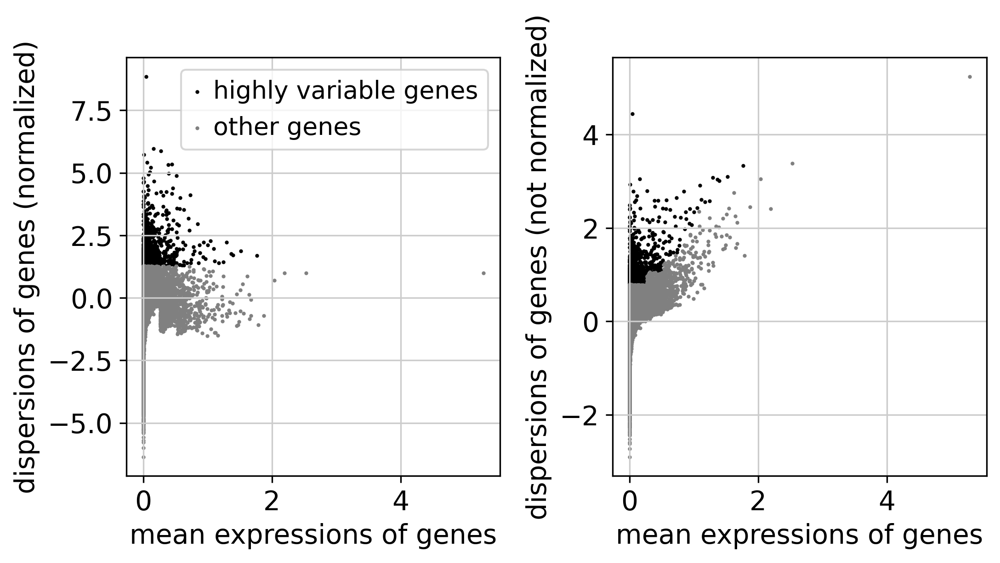

In [29]:
filter_result = sc.pp.filter_genes_dispersion(adata.X, n_top_genes=1000)
#filter_result = sc.pp.filter_genes_dispersion(adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result)

In [30]:
adata = adata[:, filter_result.gene_subset]
sc.pp.normalize_per_cell(adata)
adata.X_noscale = adata.X
sc.pp.log1p(adata)
sc.pp.regress_out(adata, ['n_counts'])
sc.pp.scale(adata)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:03): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
regressing out ['n_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:53)


In [31]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:06)


/home/mooreank/anaconda3/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/mooreank/anaconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/mooreank/anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../home/mooreank/anaconda3

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:53)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:14)


In [42]:
sc.tl.louvain(adata, resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:28)


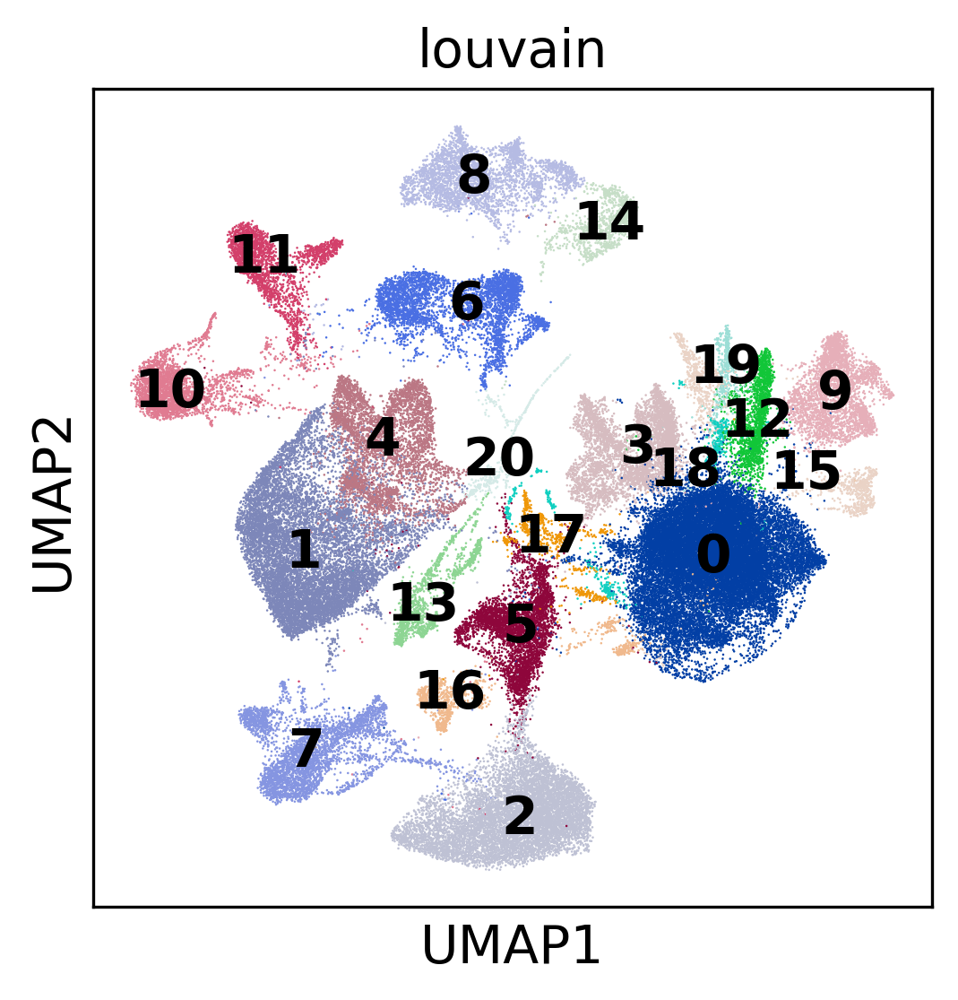

In [43]:
sc.pl.umap(adata, color='louvain',  legend_loc='on data')

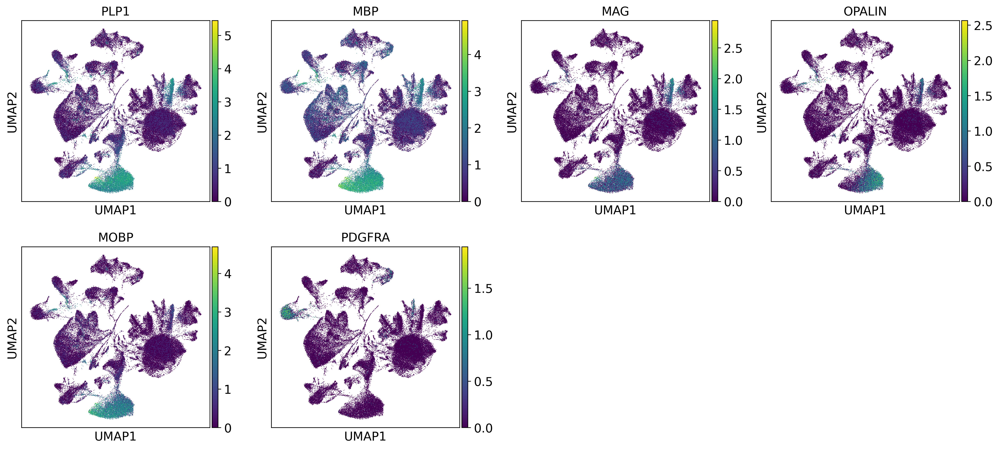

In [34]:
#Oligodendrocyte
#sc.pl.umap(adata, color=['C1qc', 'Flt1', 'Mag', 'Lcat', 'Pnoc', 'Syt1', 'Mustn1', 'Pdgfra'])
sc.pl.umap(adata, color=['PLP1','MBP', 'MAG', 'OPALIN','MOBP','PDGFRA'])

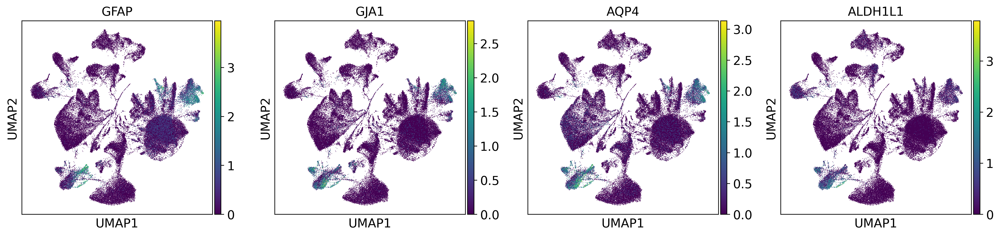

In [35]:
#Astrocytes
sc.pl.umap(adata, color=['GFAP', 'GJA1', 'AQP4', 'ALDH1L1'])

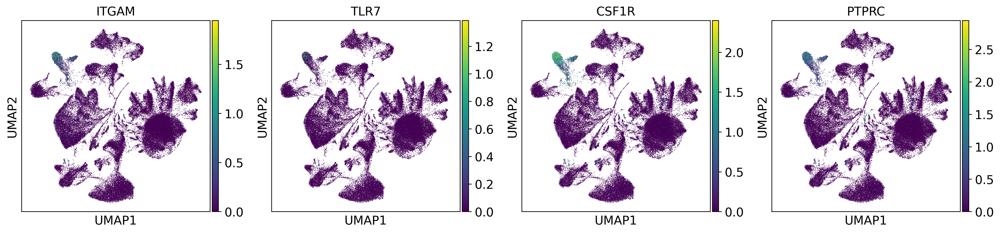

In [36]:
#Microglia
sc.pl.umap(adata, color=['ITGAM', 'TLR7', 'CSF1R', 'PTPRC'])

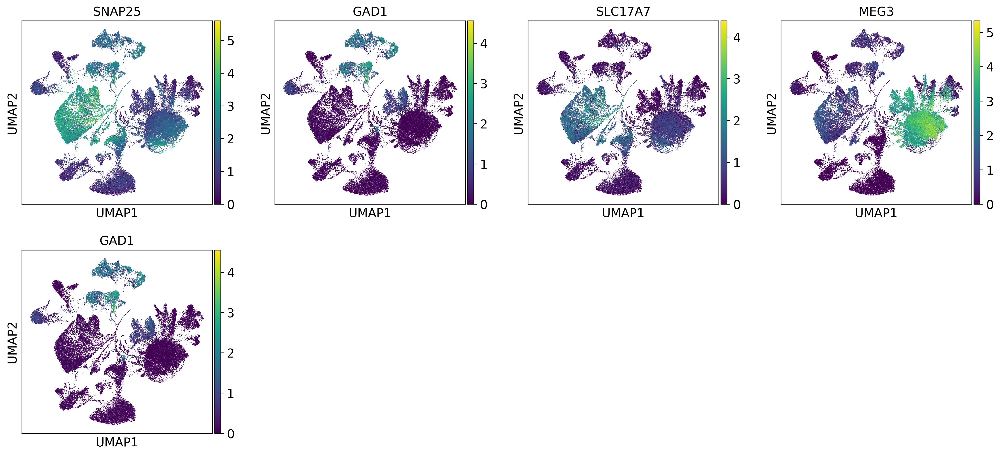

In [37]:
##Neuron
#sc.pl.umap(adata, color=['Snap25', 'Gad1', 'Slc17a7', 'Aqp4', 'Pdgfra', 'Mog', 'Itgam', 'Flt1', 'Dcn'])
sc.pl.umap(adata, color=['SNAP25','GAD1','SLC17A7','MEG3', 'GAD1'])

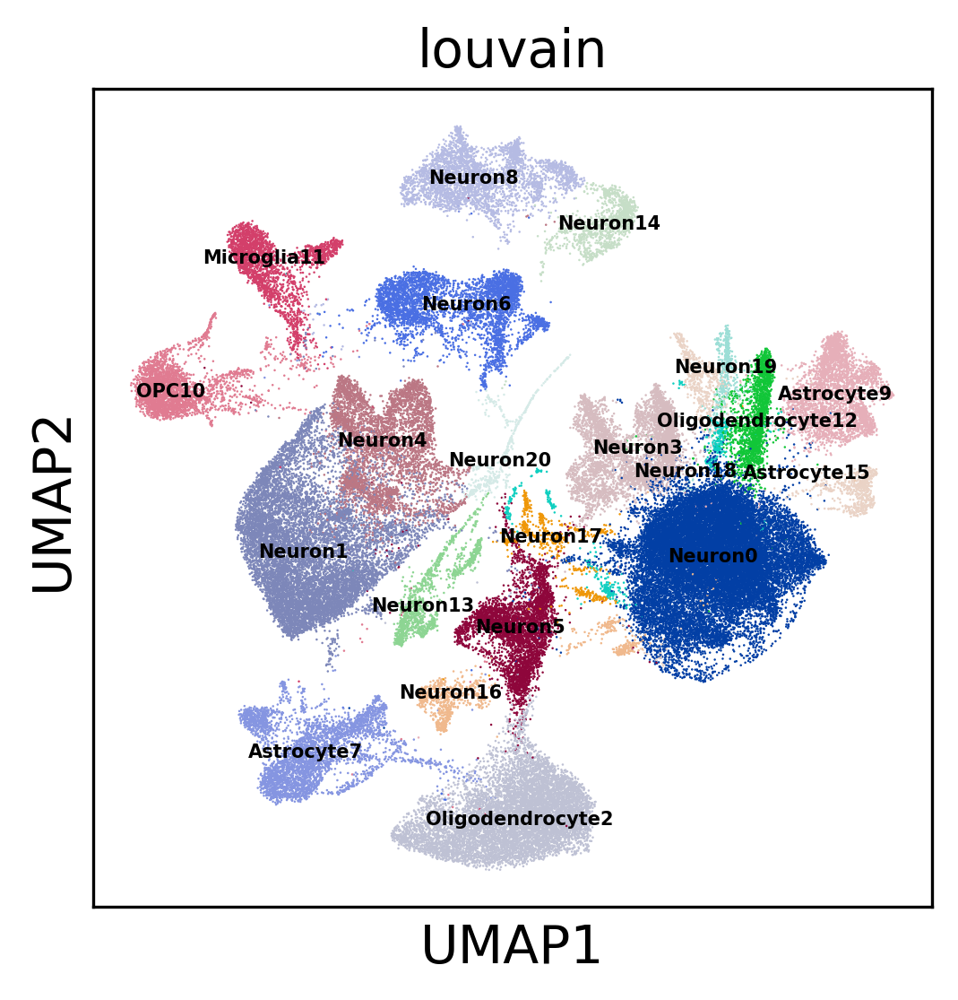

In [44]:
# new_celltypes = ['Neurons', 'Neurons2', 'Neurons3', 'Neurons4', 'Neurons5', 'Neurons6', 
#                  'Neurons7', 'Neurons8', 'Neurons9', 'Neurons10', 'Neurons11',
#                  'Neurons12', 'Neurons13', 'Astrocytes', 'OPC', 'Neurons14', 'Neurons15',
#                 'Oligodendrocytes','Microglia','Endothelial']
# Oligodendrocyte = 0,
# Astrocyte = 10,
# Microglia = 12, 
# OPC = 13
# Neuron = 1,2,3,4,5,6,7,8,9,11,14,15,16,17,18,19



new_celltypes = ['Neuron0','Neuron1', 'Oligodendrocyte2', 'Neuron3', 'Neuron4', 'Neuron5', 'Neuron6', 
                 'Astrocyte7', 'Neuron8', 'Astrocyte9', 'OPC10', 'Microglia11',
                 'Oligodendrocyte12', 'Neuron13', 'Neuron14','Astrocyte15','Neuron16','Neuron17','Neuron18',
                'Neuron19','Neuron20']

# new_celltypes = ['Oligodendrocyte0','Neuron1', 'Neuron2', 'Neuron3', 'Oligodendrocyte4', 'Neuron5', 'Neuron6', 
#                  'Neuron7', 'Neuron8', 'Neuron9', 'Neuron10', 'Neuron11',
#                  'Neuron12', 'Neuron13', 'Neuron14','Neuron15','Astrocyte16','Neuron17','Neuron18',
#                 'Oligodendrocyte19','Neuron20','Neuron21','Microglia22','Neuron23','Neuron24','Astrocyte25',
#                 'Neuron26','OPC27','Neuron28','Astrocyte29','Neuron30','Neuron31','Oligodendrocyte32','Neuron33']




adata.rename_categories('louvain', new_celltypes)
sc.pl.umap(adata, color='louvain', legend_loc='on data', legend_fontsize = 5)

In [45]:
# Make new category
celltypes = pd.DataFrame(adata.obs['louvain'])
celltypes.louvain.replace(['Neuron0', 'Neuron1', 'Neuron3', 'Neuron4', 'Neuron5', 
                           'Neuron6','Neuron8','Neuron13','Neuron14', 'Neuron16',
                           'Neuron17','Neuron18','Neuron19','Neuron20'],
                         ['Neuron', 'Neuron', 'Neuron', 'Neuron', 'Neuron', 
                          'Neuron', 'Neuron', 'Neuron','Neuron','Neuron',
                          'Neuron','Neuron','Neuron','Neuron'], inplace=True)
adata.obs['celltype'] = celltypes.louvain

In [46]:
celltypes.louvain.replace(['Oligodendrocyte2','Oligodendrocyte12',
                           'Astrocyte7','Astrocyte9','Astrocyte15',
                           'Microglia11', 'OPC10'],
                         ['Oligodendrocyte','Oligodendrocyte', 
                          'Astrocyte','Astrocyte','Astrocyte',
                          'Microglia', 'OPC'], inplace=True)
adata.obs['celltype'] = celltypes.louvain

In [33]:
# celltypes.louvain.replace(['Neuron14'],
#                          ['Neuron'], inplace=True)
# adata.obs['celltype'] = celltypes.louvain

... storing 'celltype' as categorical


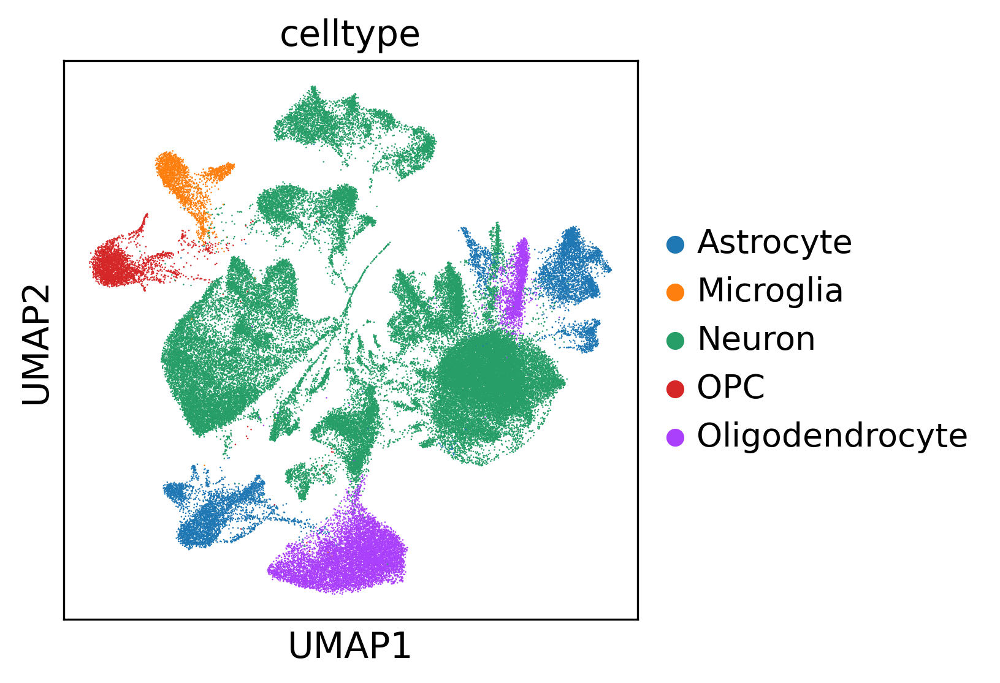

In [47]:
sc.pl.umap(adata, color='celltype')

In [ ]:
# Identify hand full of VLMCs manually
#df = pd.DataFrame(adata.X)
# df = pd.DataFrame(adata.X)
# df.columns = adata.var.index
# vlmc = df['Lum']
# vlmc_adapted = list(adata.obs['celltype'])
# for i in range(len(vlmc)):
#     if vlmc[i] > 10:
#         vlmc_adapted[i] = "VLMC"
# adata.obs['celltype'] = vlmc_adapted

In [ ]:
#sc.pl.umap(adata, color='celltype')

In [48]:
# Save celltypes
celltypes = pd.DataFrame(adata.obs['celltype'])
celltypes.columns = ['Celltype']
#celltypes['Sample'] = celltypes.index
celltypes.head()

,Celltype
AAACGCTAGGCACTAG-1-0-0,Oligodendrocyte
GTCATTTAGGAGTCTG-1-0-0,Neuron
GCATCTCTCTGGTCAA-1-0-0,OPC
TCACGCTGTGTGTTTG-1-0-0,Oligodendrocyte
CTCCCAATCGCTAATG-1-0-0,Neuron


In [26]:
celltypes.shape

(15774, 1)

In [24]:
# type_list = celltypes[['Celltype']]
# path = f'{WRKDIR}/scnabec_scanpy_raw_unassigned_NOOAM_labels_ExSet.txt'
# type_list.to_csv(path, index = True, sep = '\t')

In [49]:
# Save celltypes
celltypes = pd.DataFrame(adata.obs['celltype'])
celltypes.columns = ['Celltype']
path = f'{WRKDIR}/NOOAMv4_celltypes_scaden_training.txt'
celltypes.to_csv(path, sep="\t")

In [26]:
# path = f'{WRKDIR}/scnabec_scanpy_NOOAM.txt'
# df.to_csv(path, index = True, sep = '\t')

In [25]:
# ##raw single cell without cell type labeling 
df_raw = pd.DataFrame(adata_raw.X.toarray())
df_raw.columns = list(adata_raw.var.index)
df_raw.index = list(adata_raw.obs.index)
df_raw = df_raw.T
print(df_raw.shape)
df_raw.head()

(27009, 15774)


,AAACCCAAGACAACAT-1,AAACCCAAGATGAATC-1,AAACCCAAGCTGGCCT-1,AAACCCAAGGTCCCGT-1,AAACCCAAGGTTGAGC-1,AAACCCACAAATACGA-1,AAACCCACACCGGAAA-1,AAACCCACATTGACCA-1,AAACCCAGTATCGCAT-1,AAACCCAGTCCAAAGG-1,...,TTTGTTGGTAGGCTGA-1,TTTGTTGGTATAGGGC-1,TTTGTTGGTCGCATTA-1,TTTGTTGGTGGCTTGC-1,TTTGTTGGTTCACCGG-1,TTTGTTGTCAAGAAAC-1,TTTGTTGTCCAGTACA-1,TTTGTTGTCCTCGATC-1,TTTGTTGTCGTCGGGT-1,TTTGTTGTCTTCCACG-1
AL627309.1,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000
AL627309.2,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000
AC114498.1,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000
AL669831.5,0.0,0.0,0.426823,0.0,0.0,0.0,0.954398,0.639309,0.0,0.0,...,3.634826,0.676046,0.0,0.0,0.0,0.0,0.0,0.65473,0.0,0.637413
FAM87B,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000


In [27]:
path = f'{WRKDIR}/scnabec_scanpy_raw_unassigned_ExSet.txt'
df_raw.to_csv(path, index = True, sep = '\t')

In [30]:
##creating raw data cell type matrix
#create a dictionary of gene IDs (current feature/column labels) to gene names map
id_dict = dict(zip(celltypes['Sample'], celltypes['Celltype'])) 

#rename the features/columns using the dict (mapping)
df_raw.rename(columns=id_dict, inplace=True)
df_raw.head()

,Neuron,Neuron,Neuron,Oligodendrocyte,Oligodendrocyte,Oligodendrocyte,Neuron,Neuron,Neuron,Neuron,...,Oligodendrocyte,Neuron,Neuron,Oligodendrocyte,Oligodendrocyte,Neuron,Oligodendrocyte,Neuron,Neuron,Neuron
AL627309.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL627309.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC114498.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AL669831.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
FAM87B,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [66]:
df_raw.to_csv(f'{WRKDIR}/scnabec_scanpy_raw_NOOAM.txt', sep='\t', index=True)

In [31]:
df_raw_sub = df_raw.iloc[:, : 3000]
df_raw_sub.to_csv(f'{WRKDIR}/scnabec_scanpy_raw_NOOAM_3000.txt', sep='\t', index=True)

In [67]:
# ##normalized single cell with cell type labeling 
# df_norm = pd.DataFrame(adata_norm.X.toarray())
# df_norm.columns = list(adata_norm.var.index)
# df_norm.index = list(adata_norm.obs.index)
# df_norm = df_norm.T
# print(df_norm.shape)
# df_norm.head(n=20)

In [70]:
#create a dictionary of gene IDs (current feature/column labels) to gene names map
id_dict = dict(zip(celltypes['Sample'], celltypes['Celltype'])) 

#rename the features/columns using the dict (mapping)
df_norm.rename(columns=id_dict, inplace=True)
df_norm.head()

,Neuron,Neuron,Neuron,Oligodendrocyte,Oligodendrocyte,Oligodendrocyte,Neuron,Neuron,Neuron,Neuron,...,Oligodendrocyte,Neuron,Neuron,Oligodendrocyte,Oligodendrocyte,Neuron,Oligodendrocyte,Neuron,Neuron,Neuron
AL627309.1,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000
AL627309.2,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000
AC114498.1,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000
AL669831.5,0.0,0.0,0.426823,0.0,0.0,0.0,0.954398,0.639309,0.0,0.0,...,3.634826,0.676046,0.0,0.0,0.0,0.0,0.0,0.65473,0.0,0.637413
FAM87B,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000


In [71]:
df_norm.to_csv(f'{WRKDIR}/scnabec_scanpy_norm_NOOAM.txt', sep='\t', index=True)

In [87]:
df_norm_sub = df_norm.iloc[:, : 3000]
df_norm_sub.to_csv(f'{WRKDIR}/scnabec_scanpy_norm_NOOAM_3000.txt', sep='\t', index=True)

In [83]:
#loading in bulk data to compare genes
bulk = pd.read_csv(f'{WRKDIR}/nabec_gene_numreads_genenames.txt', sep='\t')
bulk = bulk.drop_duplicates(subset = 'Name')
bulk.index = bulk['Name']
del bulk['Name']
bulk.head()

,SH-00-34,SH-00-38,SH-00-49,SH-01-31,SH-01-37,SH-02-08,SH-02-27,SH-03-15,SH-03-17,SH-04-05,...,UMARY-72,UMARY-794,UMARY-813,UMARY-814,UMARY-818,UMARY-819,UMARY-871,UMARY-879,UMARY-914,UMARY-933
Name,,,,,,,,,,,,,,,,,,,,,
MIR517A,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AC007952.5,2.0,3.03,3.0,1.0,2.046,3.0,7.0,1.0,1.0,6.232,...,6.0,5.0,1.0,2.0,1.0,0.0,1.0,1.0,11.0,2.0
MIR518C,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR520C,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR526A1,0.0,0.00,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [84]:
bulk_norm = (bulk-bulk.mean())/bulk.std()

In [85]:
print(bulk_norm.shape)
bulk_norm.head()

(59032, 311)


,SH-00-34,SH-00-38,SH-00-49,SH-01-31,SH-01-37,SH-02-08,SH-02-27,SH-03-15,SH-03-17,SH-04-05,...,UMARY-72,UMARY-794,UMARY-813,UMARY-814,UMARY-818,UMARY-819,UMARY-871,UMARY-879,UMARY-914,UMARY-933
Name,,,,,,,,,,,,,,,,,,,,,
MIR517A,-0.051396,-0.054923,-0.063805,-0.074811,-0.075410,-0.063759,-0.087483,-0.073093,-0.087222,-0.076038,...,-0.086722,-0.045157,-0.086633,-0.052408,-0.082092,-0.100104,-0.062393,-0.057082,-0.077616,-0.059421
AC007952.5,-0.051065,-0.054402,-0.062559,-0.074413,-0.074456,-0.063359,-0.085241,-0.072654,-0.086423,-0.074582,...,-0.085644,-0.044763,-0.085997,-0.051465,-0.081830,-0.100104,-0.062113,-0.056486,-0.076853,-0.058574
MIR518C,-0.051396,-0.054923,-0.063805,-0.074811,-0.075410,-0.063759,-0.087483,-0.073093,-0.087222,-0.076038,...,-0.086722,-0.045157,-0.086633,-0.052408,-0.082092,-0.100104,-0.062393,-0.057082,-0.077616,-0.059421
MIR520C,-0.051396,-0.054923,-0.063805,-0.074811,-0.075410,-0.063759,-0.087483,-0.073093,-0.087222,-0.076038,...,-0.086722,-0.045157,-0.086633,-0.052408,-0.082092,-0.100104,-0.062393,-0.057082,-0.077616,-0.059421
MIR526A1,-0.051396,-0.054923,-0.063805,-0.074811,-0.075410,-0.063759,-0.087483,-0.073093,-0.087222,-0.076038,...,-0.086722,-0.045157,-0.086633,-0.052408,-0.082092,-0.100104,-0.062393,-0.057082,-0.077616,-0.059421


In [86]:
bulk_norm.to_csv(f'{WRKDIR}/nabec_gene_numreads_genenames_nodups_norm.txt', sep='\t')

In [92]:
bulk = bulk.sort_index()
print(bulk.shape)
bulk.head()

(59032, 311)


,SH-00-34,SH-00-38,SH-00-49,SH-01-31,SH-01-37,SH-02-08,SH-02-27,SH-03-15,SH-03-17,SH-04-05,...,UMARY-72,UMARY-794,UMARY-813,UMARY-814,UMARY-818,UMARY-819,UMARY-871,UMARY-879,UMARY-914,UMARY-933
Name,,,,,,,,,,,,,,,,,,,,,
5S_rRNA,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5_8S_rRNA,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
7SK,5.001,2.000,2.000,1.000,5.007,12.001,1.000,0.000,0.000,14.102,...,8.015,10.002,3.000,2.000,0.000,0.000,2.000,0.000,9.029,1.000
A1BG,101.891,79.468,41.698,55.510,43.337,140.810,103.403,90.338,44.629,136.979,...,158.823,119.078,12.689,32.183,69.883,47.156,33.814,23.873,278.685,39.383
A1BG-AS1,150.000,177.217,65.000,56.001,71.757,232.919,112.725,119.205,65.000,226.149,...,372.866,252.000,47.000,31.000,181.221,101.996,74.000,32.680,566.305,78.000


In [93]:
##find gene overlaps between sc and bulk
gene_list_sc = df.index.tolist()
gene_list_bulk = bulk.index.tolist()
overlap = set(gene_list_sc) & set(gene_list_bulk)
len(overlap)


26370

In [ ]:
##find gene overlaps between sc and bulk
gene_list_sc = df.index.tolist()
gene_list_bulk = bulk.index.tolist()
overlap = set(gene_list_sc) & set(gene_list_bulk)
len(overlap)



In [40]:
bulk_sub = bulk[bulk.index.isin(overlap)]
sc_sub = df[df.index.isin(overlap)]
print(bulk_sub.shape)
print(sc_sub.shape)

(978, 311)
(977, 15774)


In [95]:
##overlap between bulk and raw sc
##find gene overlaps between sc and bulk
gene_list_sc_raw = df_raw.index.tolist()
gene_list_bulk = bulk.index.tolist()
overlap = set(gene_list_sc_raw) & set(gene_list_bulk)
len(overlap)

26370

In [97]:
bulk_sub = bulk[bulk.index.isin(overlap)]
sc_raw_sub = df_raw[df_raw.index.isin(overlap)]
print(bulk_sub.shape)
print(sc_raw_sub.shape)

(26370, 311)
(26370, 15774)


In [101]:
bulk_sub.head()

,SH-00-34,SH-00-38,SH-00-49,SH-01-31,SH-01-37,SH-02-08,SH-02-27,SH-03-15,SH-03-17,SH-04-05,...,UMARY-72,UMARY-794,UMARY-813,UMARY-814,UMARY-818,UMARY-819,UMARY-871,UMARY-879,UMARY-914,UMARY-933
Name,,,,,,,,,,,,,,,,,,,,,
A1BG,101.891,79.468,41.698,55.510,43.337,140.810,103.403,90.338,44.629,136.979,...,158.823,119.078,12.689,32.183,69.883,47.156,33.814,23.873,278.685,39.383
A1BG-AS1,150.000,177.217,65.000,56.001,71.757,232.919,112.725,119.205,65.000,226.149,...,372.866,252.000,47.000,31.000,181.221,101.996,74.000,32.680,566.305,78.000
A1CF,2.000,0.000,0.000,0.000,0.000,1.000,0.000,1.823,0.000,1.005,...,12.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,4.004,0.000
A2M,3541.380,2207.810,1266.390,934.846,1189.820,2118.290,1145.000,904.003,513.000,2000.060,...,3590.010,6349.310,895.217,1711.410,2787.420,1233.910,2020.770,1060.000,5977.460,1519.970
A2M-AS1,57.000,68.000,23.001,52.000,34.000,139.214,59.000,49.000,33.000,87.947,...,54.136,118.000,29.000,14.000,48.000,64.000,62.000,12.000,168.083,24.000


In [100]:
sc_raw_sub.head()

,AAACCCAAGACAACAT-1,AAACCCAAGATGAATC-1,AAACCCAAGCTGGCCT-1,AAACCCAAGGTCCCGT-1,AAACCCAAGGTTGAGC-1,AAACCCACAAATACGA-1,AAACCCACACCGGAAA-1,AAACCCACATTGACCA-1,AAACCCAGTATCGCAT-1,AAACCCAGTCCAAAGG-1,...,TTTGTTGGTAGGCTGA-1,TTTGTTGGTATAGGGC-1,TTTGTTGGTCGCATTA-1,TTTGTTGGTGGCTTGC-1,TTTGTTGGTTCACCGG-1,TTTGTTGTCAAGAAAC-1,TTTGTTGTCCAGTACA-1,TTTGTTGTCCTCGATC-1,TTTGTTGTCGTCGGGT-1,TTTGTTGTCTTCCACG-1
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1BG-AS1,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2M,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2M-AS1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [98]:
path = f'{WRKDIR}/scnabec_scanpy_raw_unassigned_PRISM.txt'
sc_sub.to_csv(path, index = True, sep = '\t')

path = f'{WRKDIR}/nabec_gene_numreads_genenames_PRISM.txt'
bulk_sub.to_csv(path, index = True, sep = '\t')

In [46]:
sc_sub.head()

,Neuron,Neuron,Neuron,Oligodendrocyte,Oligodendrocyte,Oligodendrocyte,Neuron,Neuron,Neuron,Neuron,...,Oligodendrocyte,Neuron,Neuron,Oligodendrocyte,Oligodendrocyte,Neuron,Oligodendrocyte,Neuron,Neuron,Neuron
A2M,-0.223794,-0.231773,-0.231492,-0.199695,-0.203369,-0.206985,-0.217840,-0.231336,-0.233509,-0.213248,...,-0.205187,-0.230715,-0.217244,-0.202056,-0.204643,-0.233917,-0.198330,-0.230453,-0.230537,-0.229443
ABCA8,-0.399939,-0.123135,-0.132885,1.909805,-1.108518,2.348792,-0.606487,-0.138301,-0.062901,0.311638,...,-1.045441,-0.159815,-0.627149,0.899980,2.267525,-0.048747,1.034103,-0.168935,2.180074,-0.203971
ABCA9,-0.687858,1.947539,1.082837,-0.134741,-0.219059,-0.302067,-0.551206,1.638906,1.233885,-0.445817,...,-0.260791,-0.846726,-0.537535,-0.188923,-0.248300,-0.920209,1.820199,1.520135,-0.842633,2.449279
ABCB1,2.363752,-0.643333,-0.638632,-0.106778,-0.168226,-0.228720,-0.410283,-0.636021,1.768674,-0.333479,...,-0.198639,2.173648,1.479497,-0.146264,-0.189536,-0.679200,-0.083944,-0.621251,-0.622665,-0.604358
ABCG2,-0.098407,-0.080264,-0.080903,-0.153201,-0.144848,-0.136625,-0.111944,-0.081258,-0.076316,-0.122384,...,-0.140714,-0.082668,-0.113298,-0.147834,-0.141951,-0.075389,-0.156305,-0.083266,-0.083074,-0.085562


In [44]:
bulk_sub.head()

,SH-00-34,SH-00-38,SH-00-49,SH-01-31,SH-01-37,SH-02-08,SH-02-27,SH-03-15,SH-03-17,SH-04-05,...,UMARY-72,UMARY-794,UMARY-813,UMARY-814,UMARY-818,UMARY-819,UMARY-871,UMARY-879,UMARY-914,UMARY-933
Name,,,,,,,,,,,,,,,,,,,,,
A2M,3541.380,2207.810,1266.390,934.846,1189.820,2118.290,1145.000,904.003,513.000,2000.060,...,3590.010,6349.310,895.217,1711.410,2787.420,1233.910,2020.770,1060.000,5977.46,1519.970
ABCA8,486.693,731.098,675.008,291.244,286.080,1106.350,384.509,1440.280,412.015,2740.530,...,360.965,2168.740,366.965,203.218,663.500,2250.480,448.453,394.406,1861.20,740.814
ABCA9,336.838,489.284,297.919,425.963,345.164,752.845,637.093,282.517,215.770,857.951,...,710.248,810.630,285.968,118.974,504.569,323.656,375.687,176.848,1680.53,210.572
ABCB1,577.981,337.974,223.000,142.991,222.140,371.000,215.000,169.001,74.000,308.990,...,539.944,822.051,198.949,218.000,523.044,216.648,382.000,154.000,1197.14,174.000
ABCG2,574.828,323.000,262.000,148.364,219.644,487.955,328.000,167.254,99.000,421.999,...,852.113,1570.000,343.000,327.619,748.738,385.473,592.000,266.001,1113.38,329.124


In [45]:
path = f'{WRKDIR}/scnabec_scanpy_NOOAM_PRISM.txt'
sc_sub.to_csv(path, index = True, sep = '\t')

path = f'{WRKDIR}/nabec_gene_numreads_genenames_PRISM.txt'
bulk_sub.to_csv(path, index = True, sep = '\t')

In [121]:
# Rank the genes
sc.tl.rank_genes_groups(adata, 'celltype')
top_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
top_genes.head(num_top_genes)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


,Astrocyte,Microglia,Neurons,OPC,Oligodendrocyte
0,RNF219-AS1,LRMDA,MYT1L,LHFPL3,ST18
1,ADGRV1,DOCK8,DLGAP1,PTPRZ1,PLP1
2,GPC5,ARHGAP24,RBFOX1,PCDH15,RNF220
3,SLC1A2,APBB1IP,GRIN2B,VCAN,MBP
4,NHSL1,ITPR2,NRG3,MEGF11,DOCK5
5,LINC00499,PLXDC2,FGF14,MAML2,MOBP
6,SLC1A3,AC008691.1,PTPRN2,AC004852.2,CTNNA3
7,GFAP,TBXAS1,CCSER1,SOX6,PIP4K2A
8,PRDM16,ST6GAL1,FAM155A,CHST11,QKI
9,HPSE2,P2RY12,PLCB1,SEMA5A,C10orf90


In [124]:
top_genes = top_genes.head(num_top_genes)
top_genes_flat = pd.DataFrame(top_genes.values.flatten())
num = str(num_top_genes)
path = f'{WRKDIR}/basic_top_genes_{num}_scaden_training.txt'
top_genes_flat.to_csv(path , sep="\t")

# Save the data